In [148]:
import pandas as pd
from Sequential_Fish.pipeline_parameters import RUN_PATH

# TABLES

In [149]:
import os
os.listdir(RUN_PATH + "/result_tables/")

['Acquisition.feather',
 'Drift_FFT_nogaussianblur.feather',
 'Drift_pairwise.feather',
 'Spots.feather',
 'Gene_map.xlsx',
 'Gene_map.feather',
 'Drift.xlsx',
 'Clusters.feather',
 'Acquisition.xlsx',
 'Detection.feather',
 'Drift.feather',
 'Colocalisation.feather',
 'Cell.feather']

In [150]:
Acquisition = pd.read_feather(RUN_PATH + "/result_tables/Acquisition.feather")
Detection = pd.read_feather(RUN_PATH + "/result_tables/Detection.feather")
Spots = pd.read_feather(RUN_PATH + "/result_tables/Spots.feather")
Clusters = pd.read_feather(RUN_PATH + "/result_tables/Clusters.feather")
Drift = pd.read_feather(RUN_PATH + "/result_tables/Drift.feather")
Gene_map = pd.read_feather(RUN_PATH + "/result_tables/Gene_map.feather")
Cell = pd.read_feather(RUN_PATH + "/result_tables/Cell.feather")
Colocalisation = pd.read_feather(RUN_PATH + "/result_tables/Colocalisation.feather")

# Segmentation

In [151]:
import os
seg_files = os.listdir(RUN_PATH + "/segmentation/")
seg_files

['Location-04_segmentation.npz',
 'Location-05_segmentation.npz',
 'Location-09_segmentation.npz',
 'Location-07_segmentation.npz',
 'Location-01_segmentation.npz',
 'Location-06_segmentation.npz',
 'Location-03_segmentation.npz',
 'Location-02_segmentation.npz',
 'Location-10_segmentation.npz']

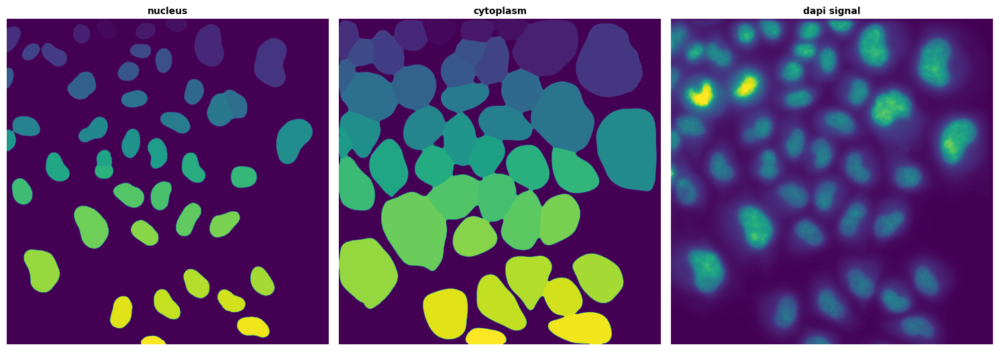

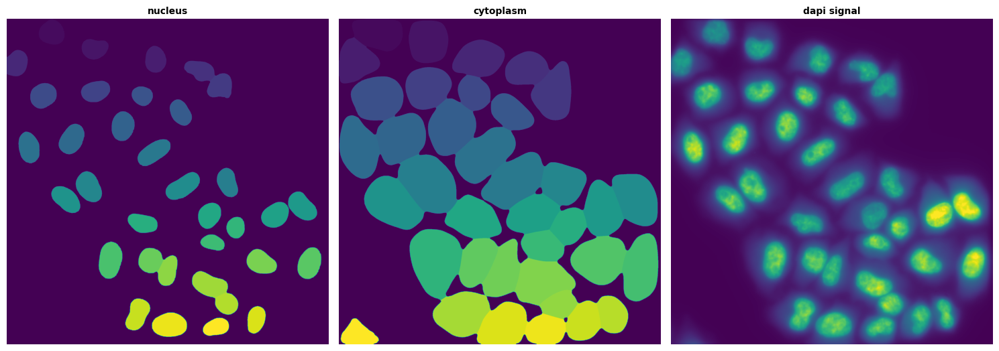

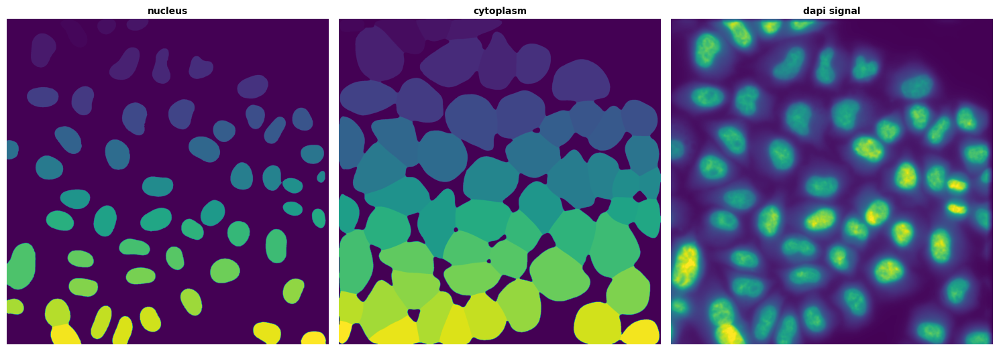

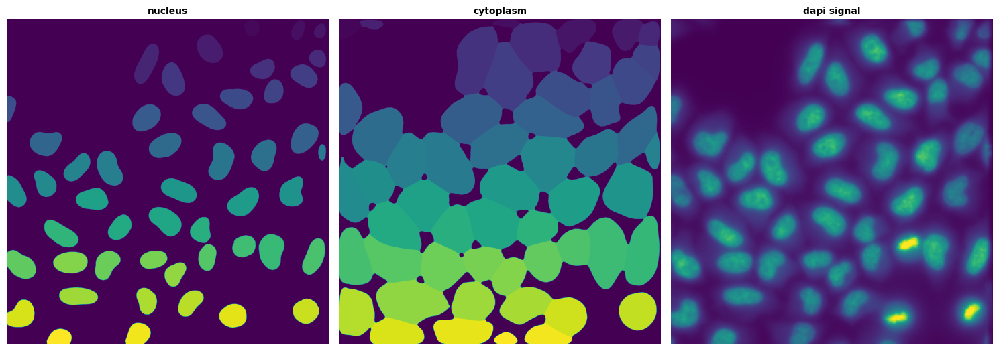

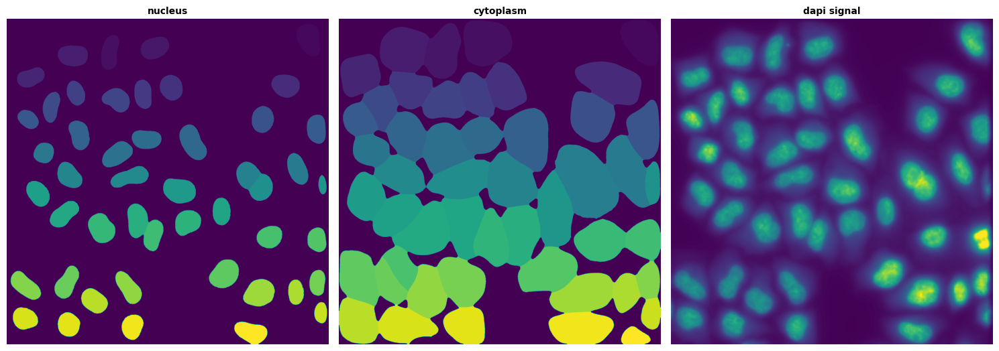

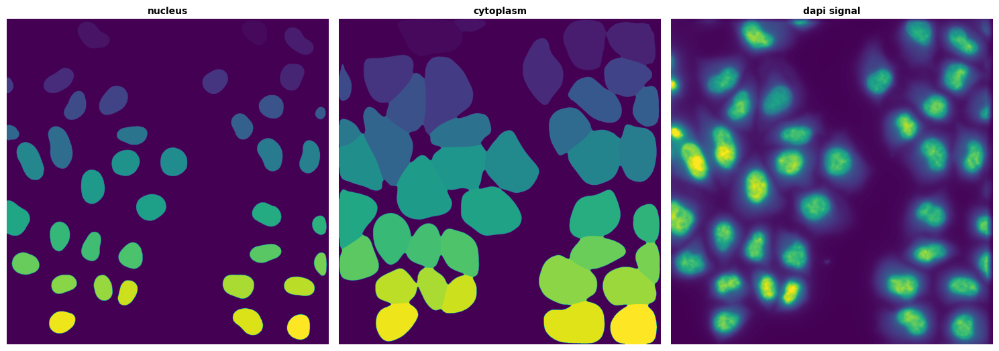

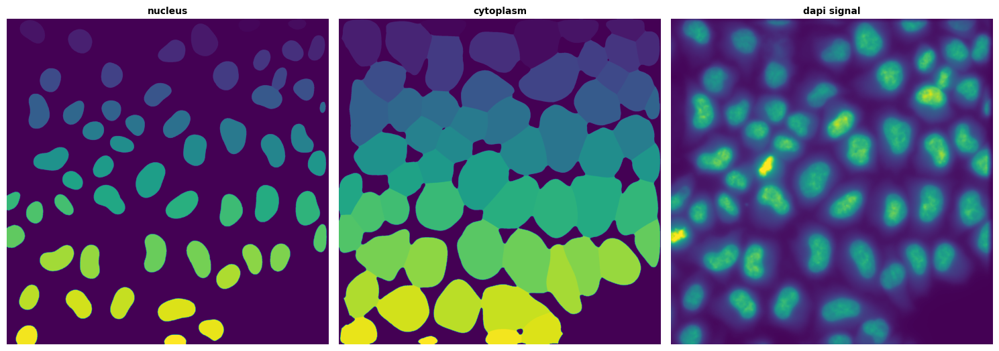

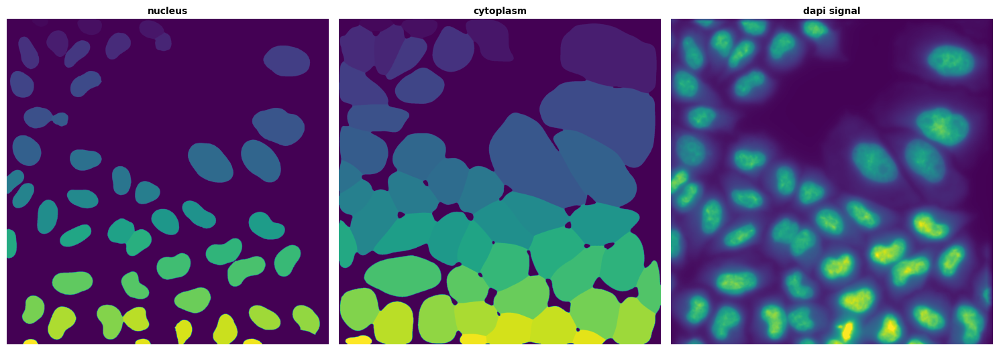

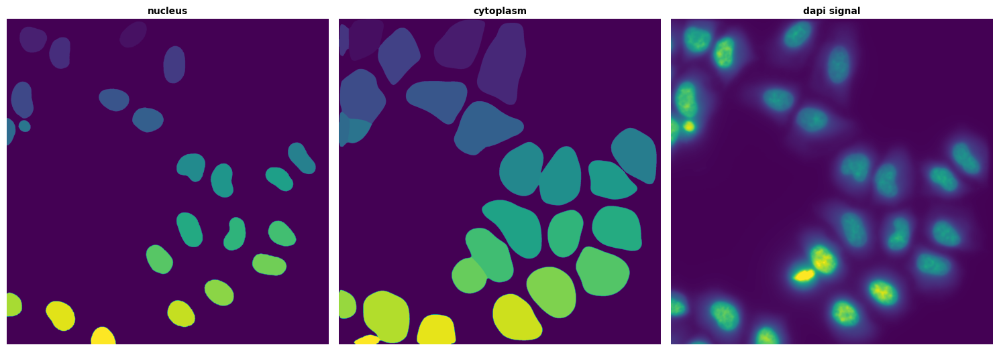

In [152]:
import numpy as np
import bigfish.plot as plot
for file in seg_files : 
    masks = np.load(RUN_PATH + "/segmentation/{0}".format(file))

    nucleus_signal = np.mean(masks['dapi_signal'],axis=0)
    plot.plot_images([masks['nucleus'],masks['cytoplasm'],nucleus_signal],contrast=True, titles=['nucleus','cytoplasm','dapi signal'])

# Drift testing

In [153]:
import os
import matplotlib.pyplot as plt
import bigfish.stack as stack
import numpy as np
from pbwrap.utils import open_image
locations = os.listdir(RUN_PATH + "FISH_Z-stacks")
locations.sort()
locations

['Location-01',
 'Location-02',
 'Location-03',
 'Location-04',
 'Location-05',
 'Location-06',
 'Location-07',
 'Location-09',
 'Location-10']

In [154]:
def image_print(reference, drifted_image, corrected_image) :
    reference = stack.rescale(np.max(reference, axis=0), channel_to_stretch=0)
    drifted_image = stack.rescale(np.max(drifted_image, axis=0), channel_to_stretch=0)
    corrected_image = stack.rescale(np.max(corrected_image, axis=0),channel_to_stretch=0)

    drifted_rgb = np.zeros(shape= tuple(reference.shape) + (3,), dtype=int)
    drifted_rgb[...,0] = stack.cast_img_uint8(reference)
    drifted_rgb[...,1] = stack.cast_img_uint8(drifted_image)

    corrected_rgb = np.zeros(shape= tuple(reference.shape) + (3,), dtype=int)
    corrected_rgb[...,0] = stack.cast_img_uint8(reference)
    corrected_rgb[...,1] = stack.cast_img_uint8(corrected_image)

    fig,axes = plt.subplots(1,2, figsize=(12,24))
    fig.sca(axes[0])
    plt.imshow(corrected_rgb)
    plt.title("CORRECTED IMAGE")

    fig.sca(axes[1])
    plt.imshow(drifted_rgb)
    plt.title("DRIFTED IMAGE")


    plt.show()

## Select location

In [155]:
location = locations[1]
print(f"{location}")

Location-02


In [156]:
from Sequential_Fish.pipeline_parameters import DRIFT_SLICE_TO_REMOVE
DRIFT_SLICE_TO_REMOVE[0] = 5
DRIFT_SLICE_TO_REMOVE[1] = 5

#Open image and select beads
path = RUN_PATH + "/FISH_Z-stacks/" + location
images = os.listdir(path)
images.sort()
fish_hyperstack = open_image(path + '/'+images[0])
fish_hyperstack = fish_hyperstack[...,-1] # Selecting beads
fish_hyperstack = fish_hyperstack[:,DRIFT_SLICE_TO_REMOVE[0]:-DRIFT_SLICE_TO_REMOVE[1],...] # Selecting beads

print(fish_hyperstack.shape)
shape = (fish_hyperstack.shape)



(14, 46, 1981, 2004)


Cycle 1


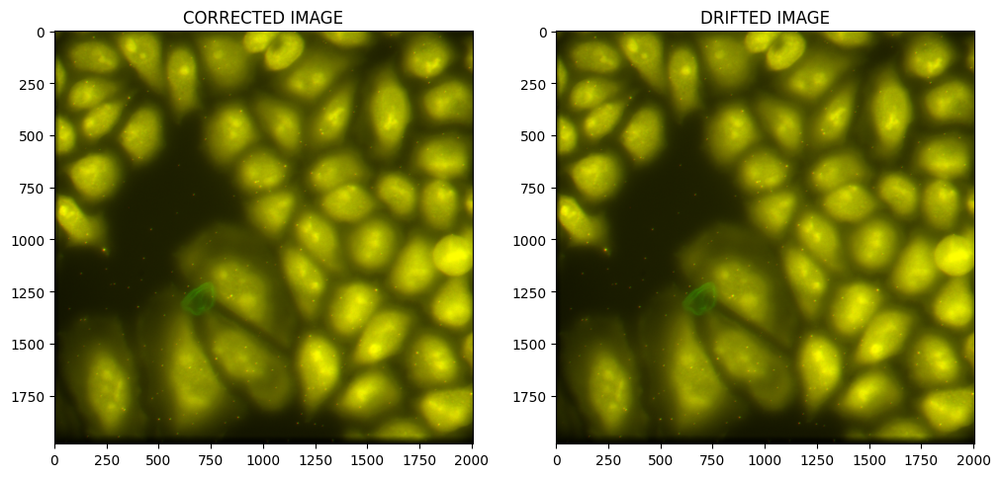

Cycle 2


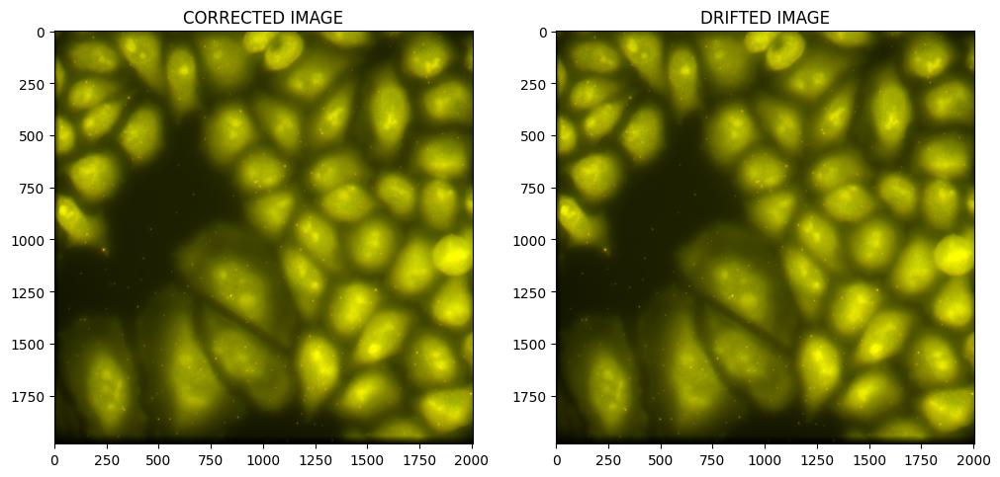

Cycle 3


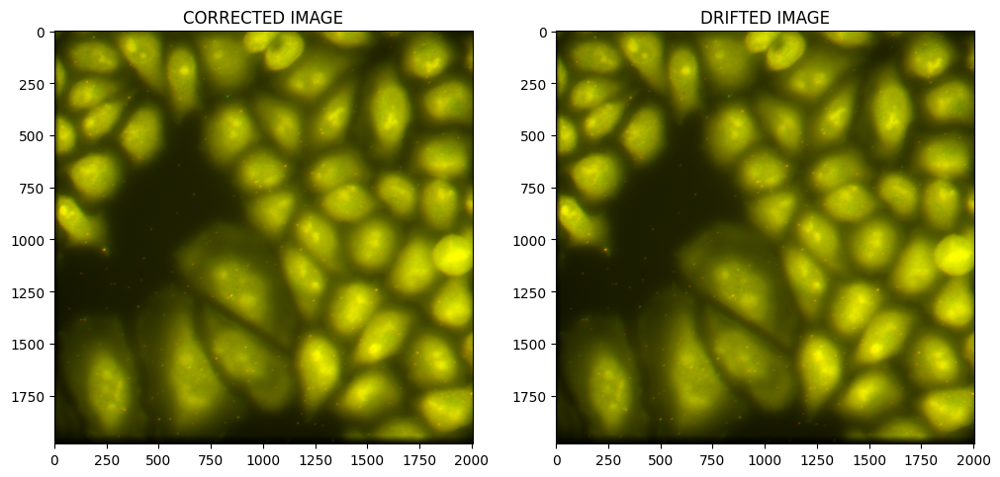

Cycle 4


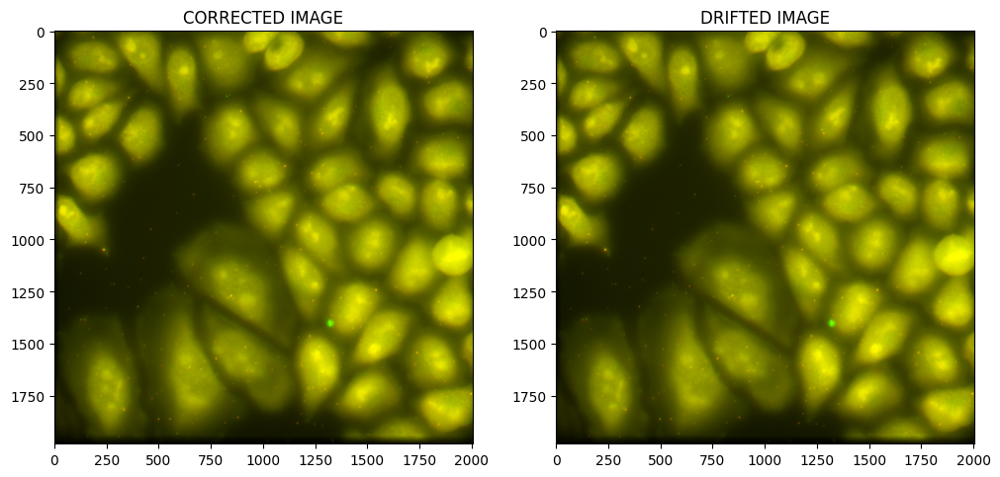

Cycle 5


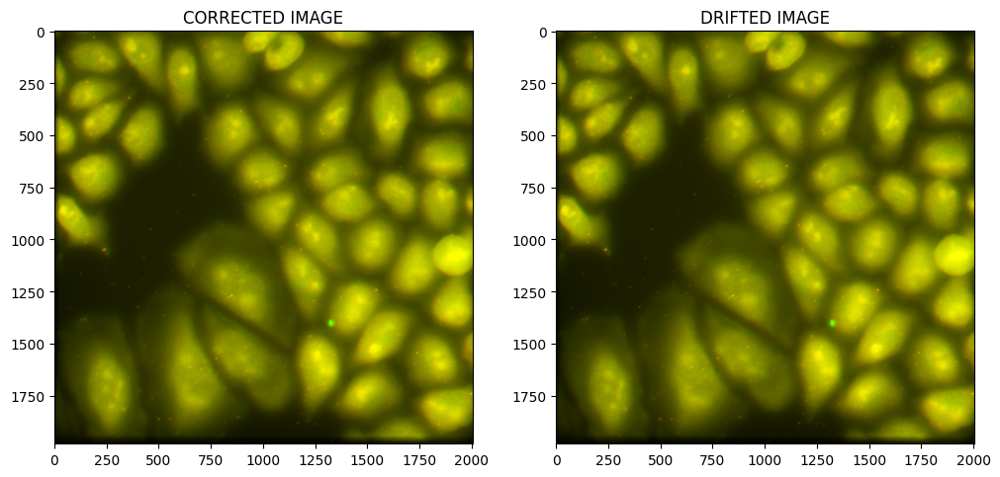

Cycle 6


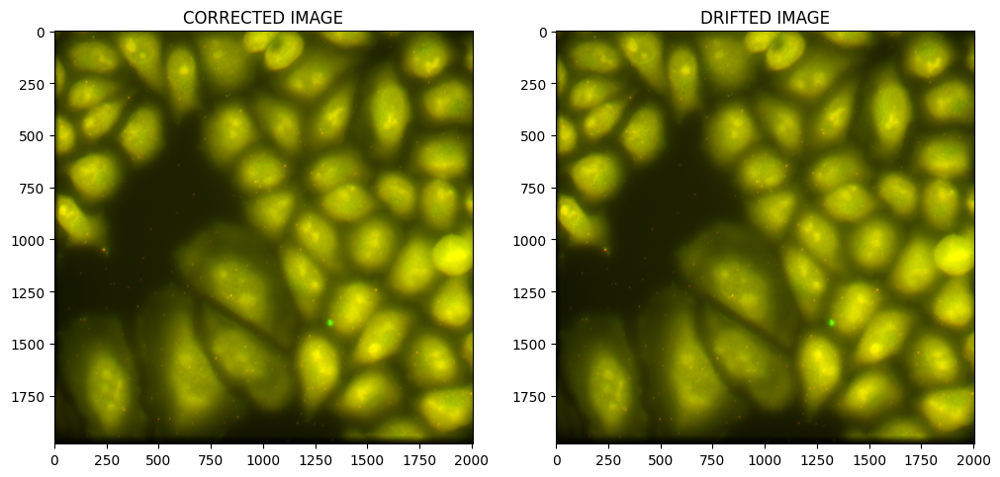

Cycle 7


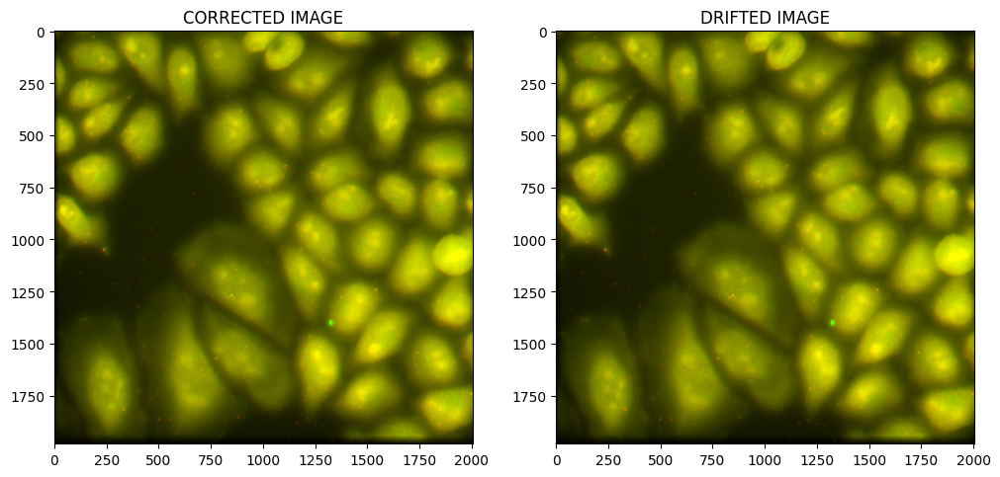

Cycle 8


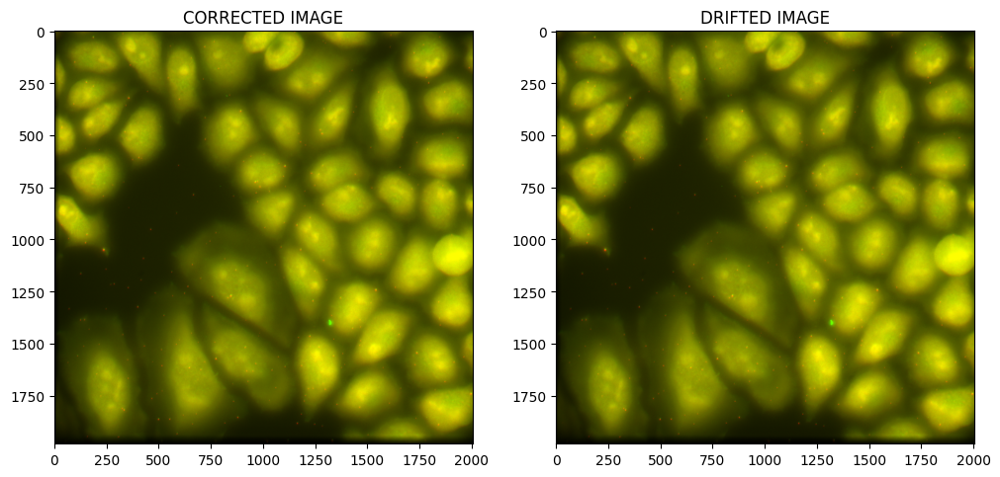

Cycle 9


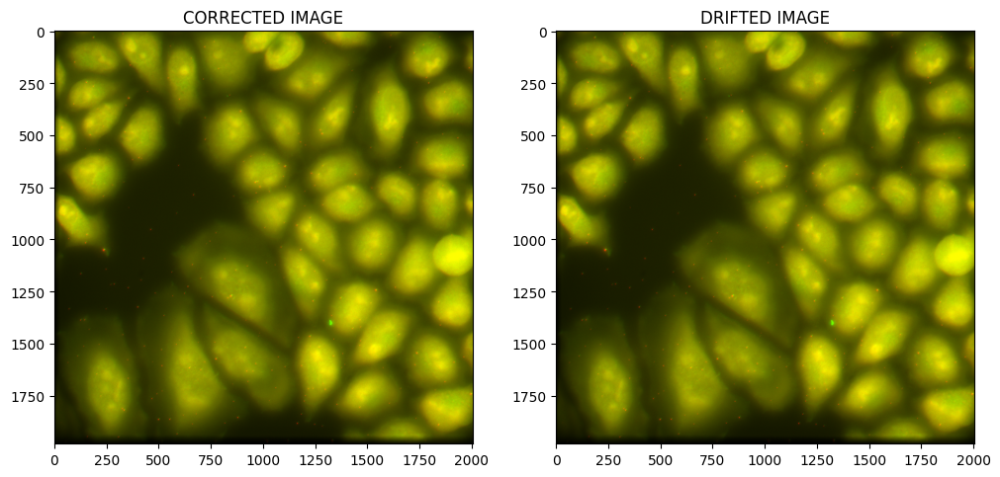

Cycle 10


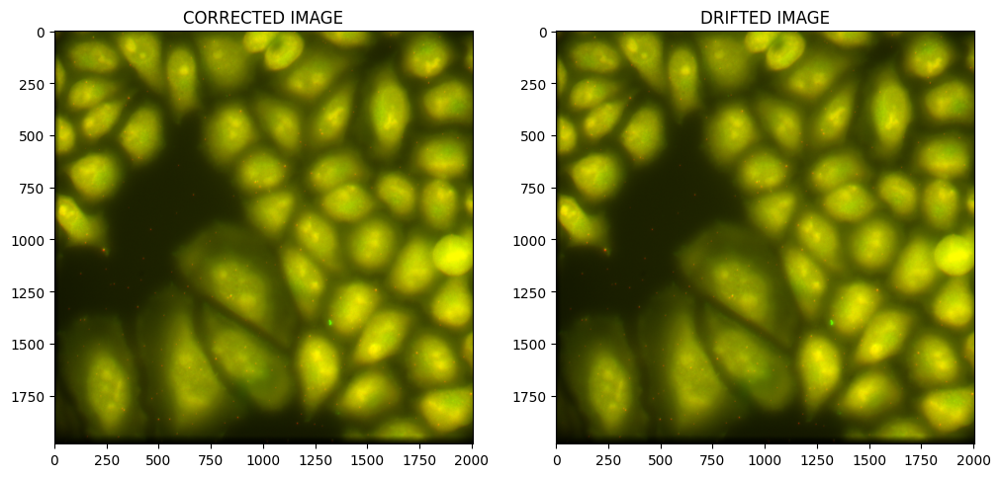

Cycle 11


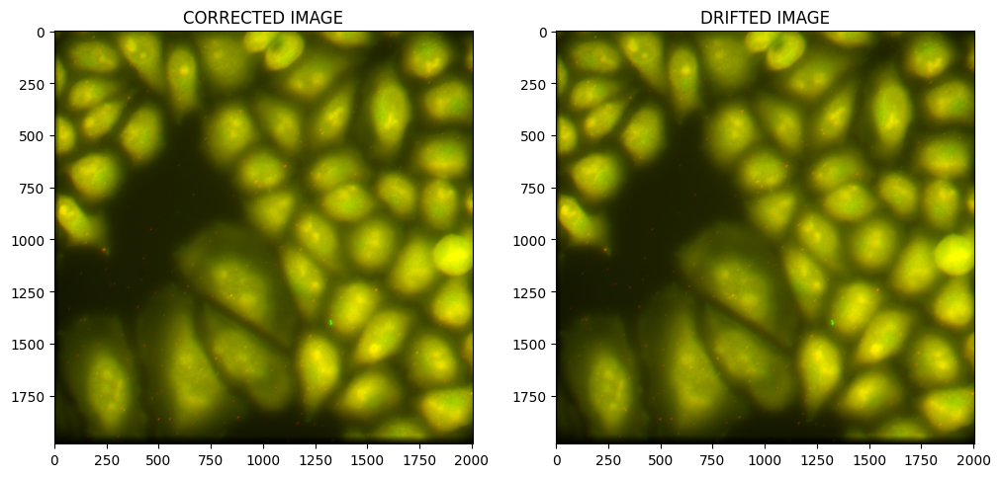

Cycle 12


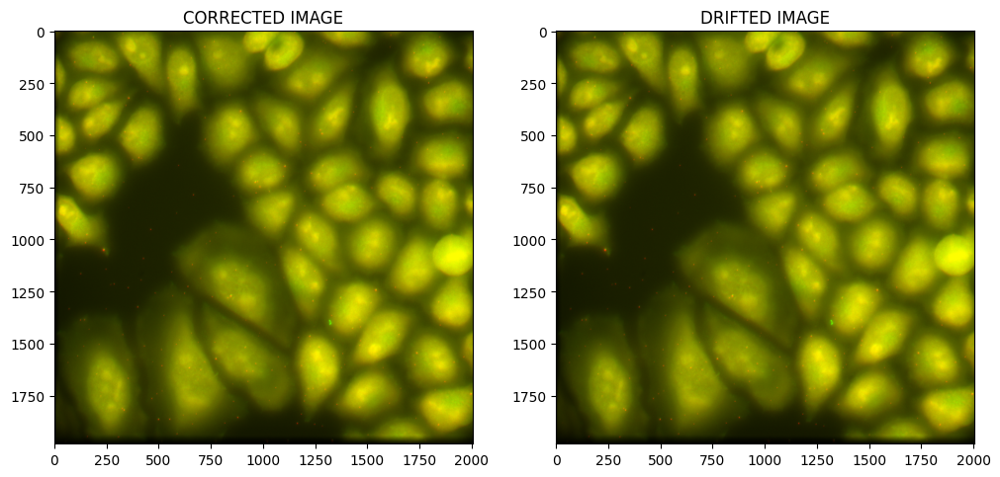

Cycle 13


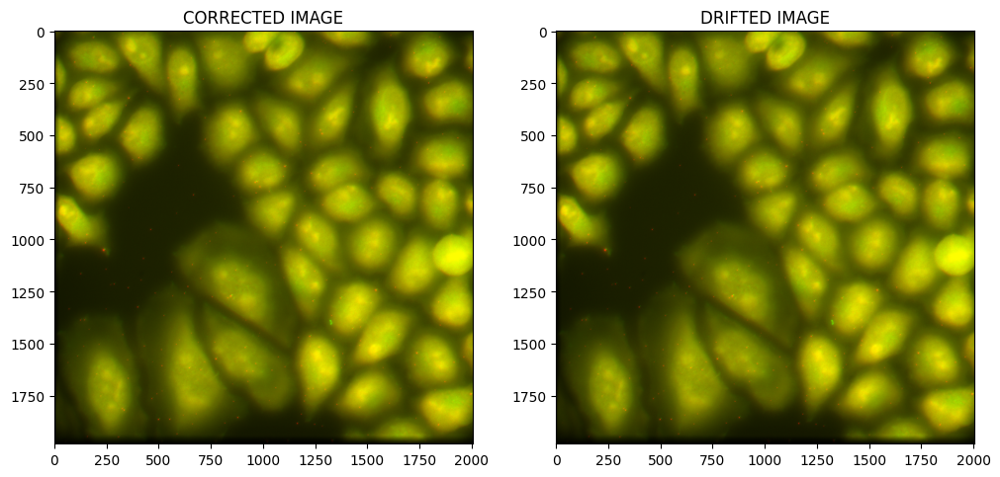

In [157]:
reference = fish_hyperstack[0]
for index in range(1,shape[0]) :
    drifted_image = fish_hyperstack[index]
    print(f'Cycle {index}')
    image_print(reference,drifted_image,drifted_image)

In [158]:
from Sequential_Fish.pipeline_parameters import BEAD_SIZE, VOXEL_SIZE

cycle 1
shift :  [ 0.  2. -4.]
(0, 2, -4)


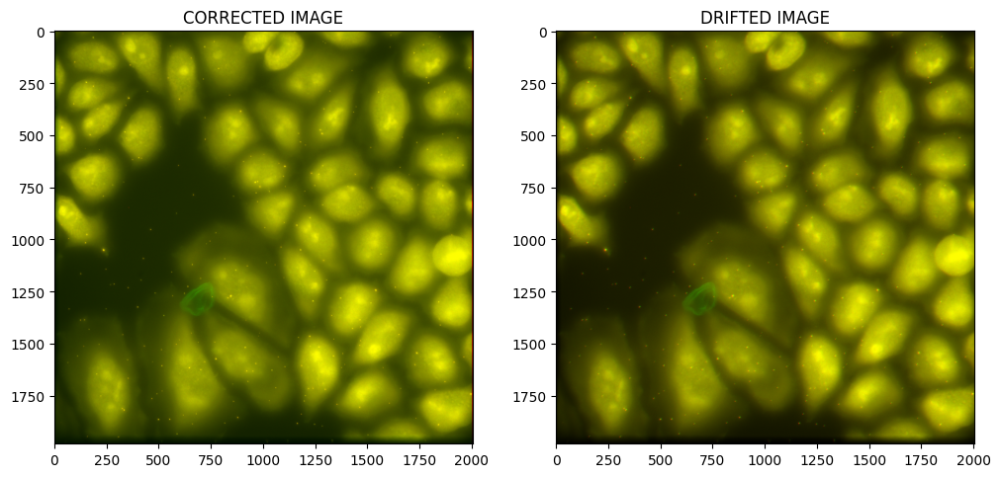

cycle 2


In [ ]:
import pbwrap.preprocessing.alignement as prepro
for index in range(1,shape[0]) :
    print(f"cycle {index}")
    drifted_image = fish_hyperstack[index]
    drift = prepro.fft_phase_correlation_drift(
        reference,
        drifted_image,
        bead_size=BEAD_SIZE,
        voxel_size=VOXEL_SIZE
        )
    drift = (drift['drift_z'][0], drift['drift_y'][0], drift['drift_x'][0])
    print(drift)
    corrected_im = prepro.shift_array(drifted_image, *drift)
    image_print(reference, drifted_image, corrected_im)


## a.background removal

(46, 1981, 2004)


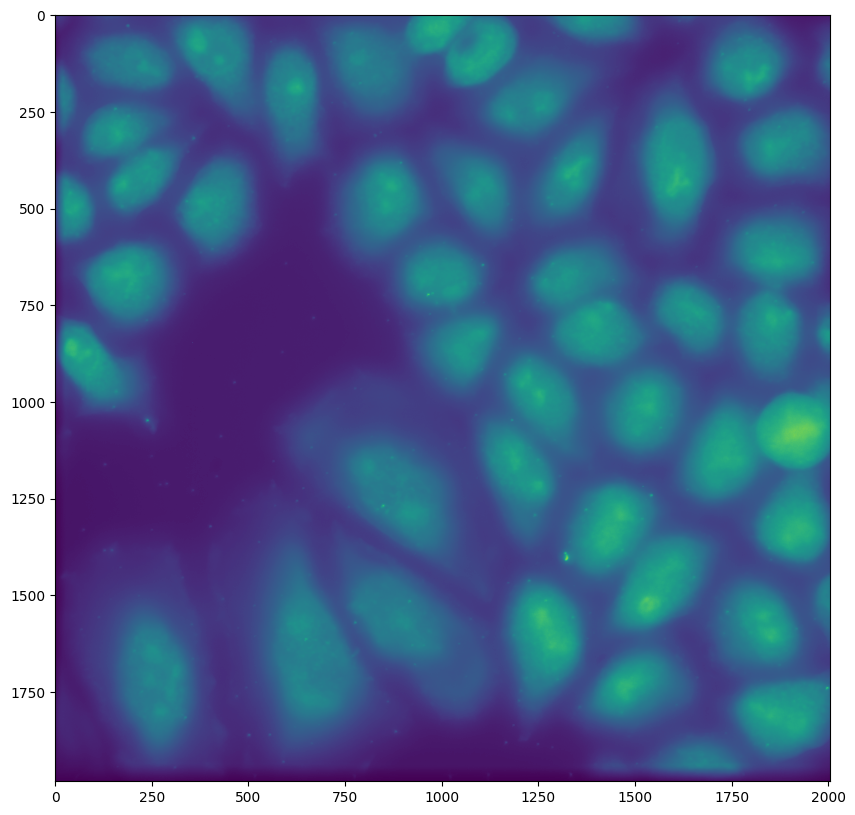

In [ ]:
background = np.mean(fish_hyperstack,axis=0)
print(background.shape)
plt.figure(figsize=(10,10))
plt.imshow(np.max(background,axis=0))
plt.show()

4


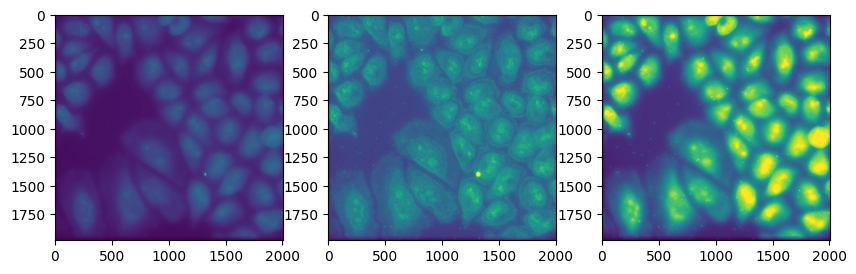

5


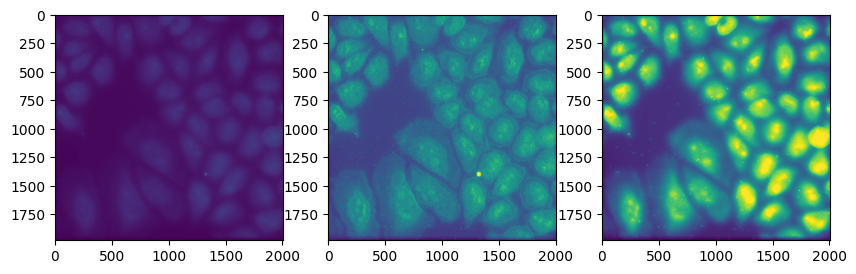

13


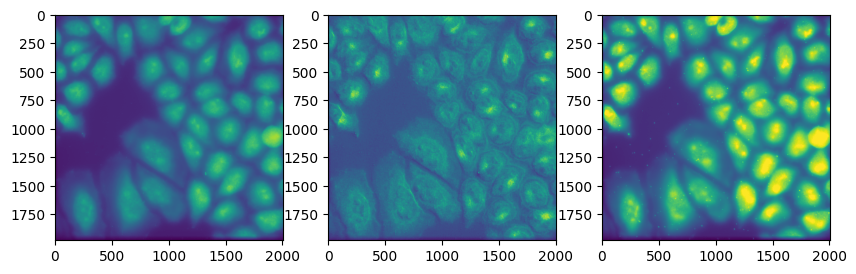

11


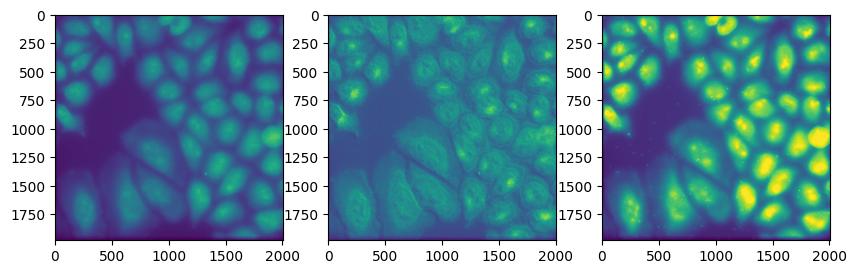

In [ ]:
## CYCLES NOT WORKING : 13, 11
target = [4,5, 13,11]
for cycle in target :
    print(cycle)
    
    drifted_image :np.ndarray = fish_hyperstack[cycle]
    drifted_image = drifted_image -  background
    drifted_image[drifted_image < 0] = 0
    drifted_image = np.max(drifted_image,axis=0)
    drifted_image = stack.rescale(drifted_image, channel_to_stretch=0)

    plt.subplots(1,3, figsize = (10,20))
    plt.subplot(1,3,1)
    plt.imshow(np.max(fish_hyperstack[cycle],axis=0))
    plt.subplot(1,3,2)
    plt.imshow(drifted_image)
    plt.subplot(1,3,3)
    plt.imshow(np.max(stack.rescale(reference, channel_to_stretch=0),axis=0))
    plt.show()